In [1]:
import sys

sys.path.insert(0, "/mnt/data/users/lily/triage/src")
#sys.path.append("/home/liliana/.pyenv/versions/triage/lib/python3.9/site-packages")

In [2]:
from triage.component.postmodeling.contrast.model_class import ModelAnalyzer
from triage.component.postmodeling.contrast.report_generator import PostmodelingReport

In [3]:
import pandas as pd
from sqlalchemy import create_engine

### DB Connection

In [4]:
# The connection to the db which has the triage experiment information
engine = create_engine("postgresql:///?service=acdhs_housing")

### Inputs to the report generator

In [5]:
model_groups=[362, 363]
experiment_hash = ['13e7d216a2922b2dcae51f2d68242aae']
project_path = 's3://dsapp-social-services-migrated/acdhs_housing/triage_experiments/' 

### Initializing the object

In [6]:
rep = PostmodelingReport(engine, model_groups=model_groups, experiment_hashes=experiment_hash, project_path=project_path)

### TODO -- Summary

We could generate a summary of what models we are comparing, chort sizes, label distributions

## 1. Score distributions

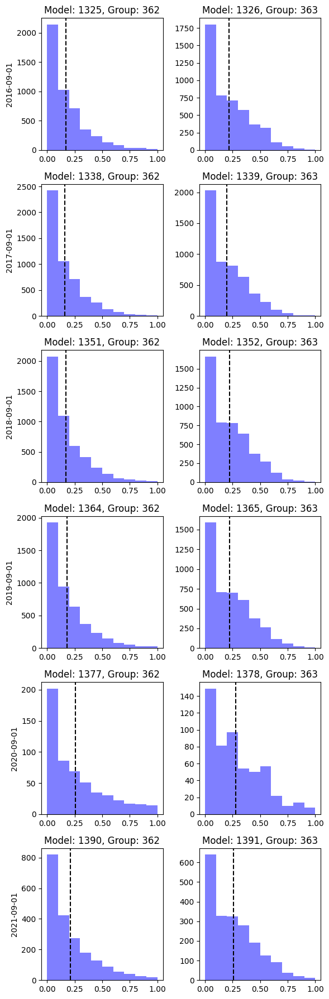

In [8]:
rep.plot_score_distributions()

note to myself -- What's the vertical line? (check the model analyzer class)

### 2. PR-k Curves

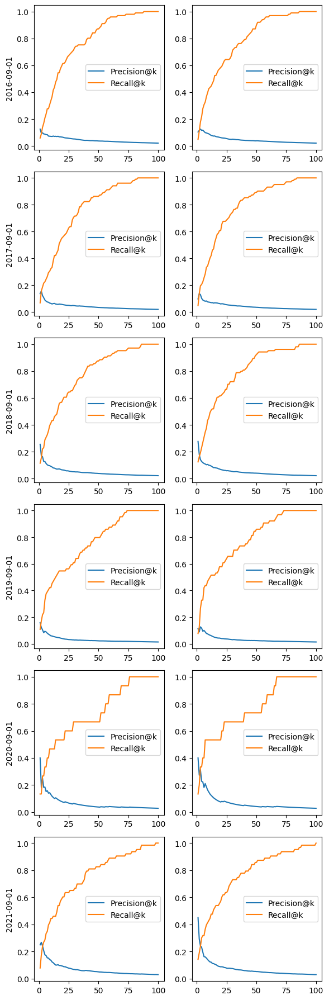

In [9]:
rep.plot_prk_curves()

### 3. Feature Importance

In [10]:
rep.plot_feature_importance()

KeyError: 352

### 4. Crosstabs

In [10]:
rep.calculate_crosstabs_pos_vs_neg(
    project_path=project_path,
    thresholds={'rank_abs_no_ties': 100},
    table_name='kasun_crosstab_test3',
    return_df=False,
    push_to_db=True,
    replace=False
) 

2023-04-18 19:24:53 - WARNING Crosstabs aleady exist for model 1397
2023-04-18 19:24:53 -    INFO Replace set to False. Not calculating crosstabs for model 1397
2023-04-18 19:24:53 - WARNING Crosstabs aleady exist for model 1401
2023-04-18 19:24:53 -    INFO Replace set to False. Not calculating crosstabs for model 1401
2023-04-18 19:24:54 - WARNING Crosstabs aleady exist for model 1405
2023-04-18 19:24:54 -    INFO Replace set to False. Not calculating crosstabs for model 1405
2023-04-18 19:24:54 - WARNING Crosstabs aleady exist for model 1409
2023-04-18 19:24:54 -    INFO Replace set to False. Not calculating crosstabs for model 1409
2023-04-18 19:24:54 - WARNING Crosstabs aleady exist for model 1413
2023-04-18 19:24:54 -    INFO Replace set to False. Not calculating crosstabs for model 1413
2023-04-18 19:24:54 - WARNING Crosstabs aleady exist for model 1417
2023-04-18 19:24:54 -    INFO Replace set to False. Not calculating crosstabs for model 1417
2023-04-18 19:24:54 - WARNING Cros

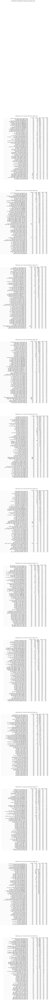

In [12]:
dfs = rep.display_crosstab_pos_vs_neg(
    threshold_type='rank_abs_no_ties',
    threshold=100,
    table_name='kasun_crosstab_test3',
    project_path=project_path,
    display_n_features=40,
    filter_features=None,
    support_threshold=0.2,
    return_dfs=True
)

### 5. Error analysis

This analysis aims to identify which features and their corresponding values are present while the model have mistakes assigning negative labels (FN), assigning positive labels (FP) and both errors, assigning negative and positive labels (FN & FP). 

#### Mistakes in assigning negative labels 

(`error_type`: `error_negative_label`)

A Decision Tree (DT) is trained based on the True and False **negative** values assigned by the predicting model. The positive labels (1) are the mistakes (FN), while the negative labels (0) are the asserts of the predictive model for the negative label (TN).  


The output will take the features with the top feature importance, and so, those features are the ones present when the model makes mistakes assinging negative labels. 

#### Mistakes in assigning positive labels 

(`error_type`: `error_positive_label`)

A Decision Tree (DT) is trained based on the True and False **positive** values assigned by the predicting model. The positive labels (1) are the mistakes (FP), while the negative labels (0) are the asserts of the predictive model for the positive label (TP).  

The output will take the features with the top feature importance, and so, those features are the ones present when the model makes mistakes assinging positive labels. 

#### Mistakes in assigning negative and positive labels 

(`error_type`: `error_general_label`)

A Decision Tree (DT) is trained based on the True and False values assigned by the predicting model. The positive labels (1) are the mistakes (FN and FP), while the negative labels (0) are the asserts of the predictive model in both, the positive and negative label (TP and TN).  

The output will refer the features with the top feature importance, and so, those features are the ones present when the model makes mistakes assinging negative labels. 

#### How to generate an error analysis

Within the postmodeling configuration file `triage.component.postmodeling.postmodeling_config.yaml` there is a section for the error analysis that defines the different sizes of lists, the maximum depth tried on different decision trees, and a flag indicating if the outputs are going to be plotted or saved. 

The following snippet of code shows an example of the `postmodeling_confg.yaml` with the default values for each element of the error analysis.
```
error_analysis:
    
  k: [100, 200, 300]

  model_params:
    max_depth: [1, 3, 5, 10, ~]
   
  view_plots: False
```

You can run the error analysis with the default values, or you can change them -specially the size of the list- depending on your specific project. 

2023-06-01 20:28:19 -    INFO generating error analysis for model id 1325
2023-06-01 20:28:19 -    INFO extracting predictions from model id: 1325
2023-06-01 20:28:19 -    INFO Found credentials in shared credentials file: ~/.aws/credentials
Error Analysis
--------------

        
    Model id: 1325
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


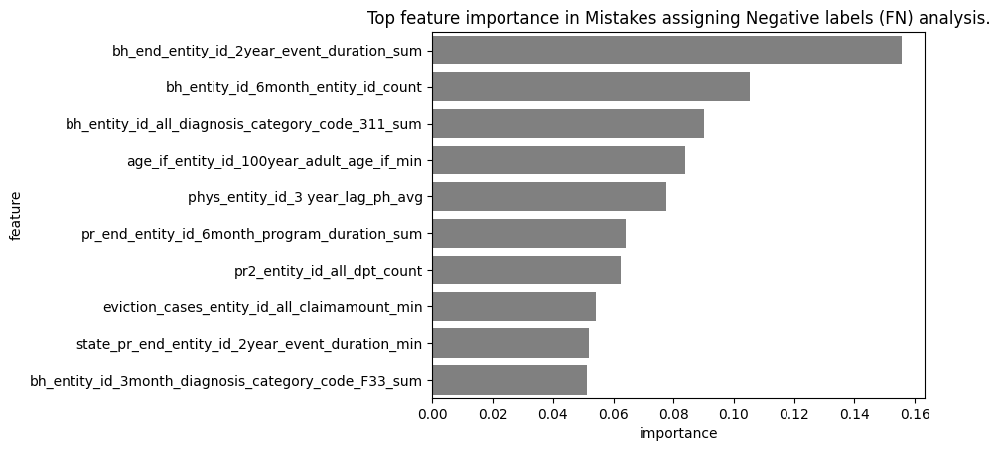


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


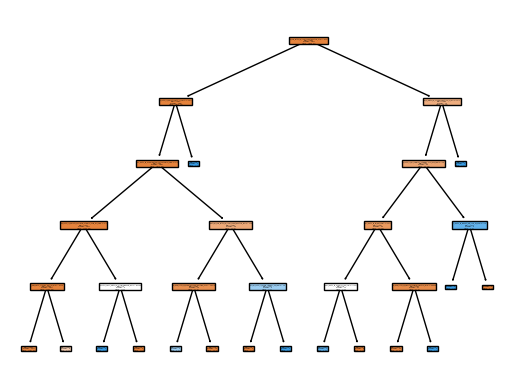

             ######            

        
    Model id: 1325
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


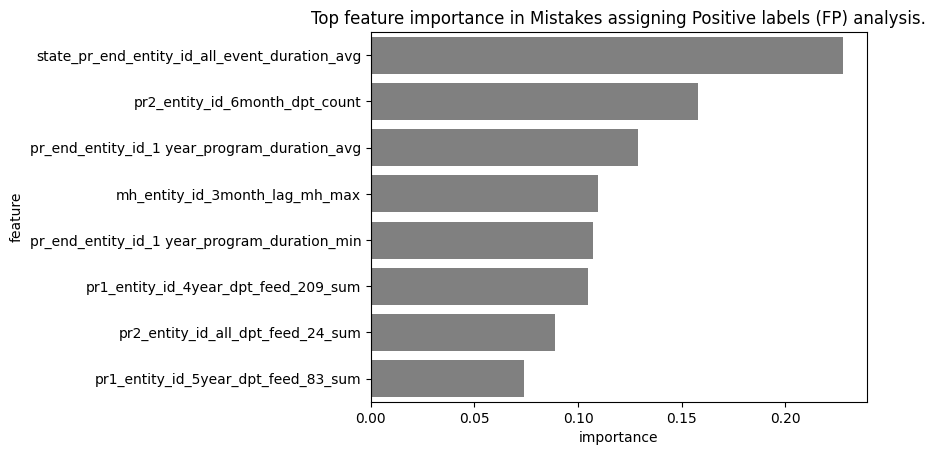


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


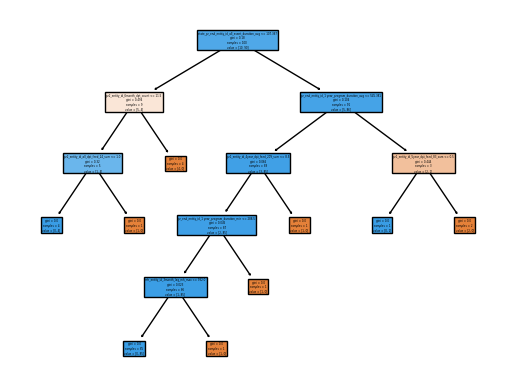

             ######            

        
    Model id: 1325
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


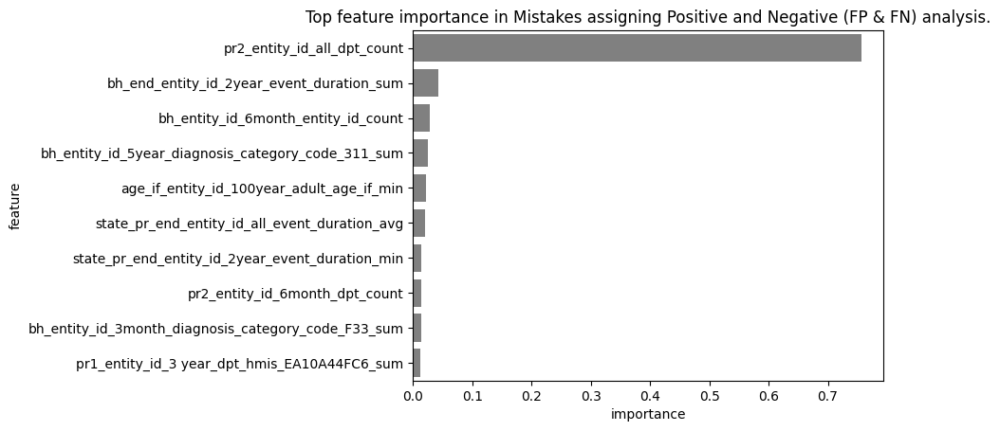


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


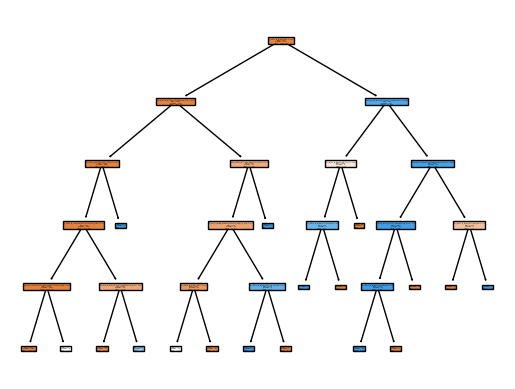

             ######            
*******************************************
2023-06-01 20:28:32 -    INFO generating error analysis for model id 1326
2023-06-01 20:28:32 -    INFO extracting predictions from model id: 1326
Error Analysis
--------------

        
    Model id: 1326
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


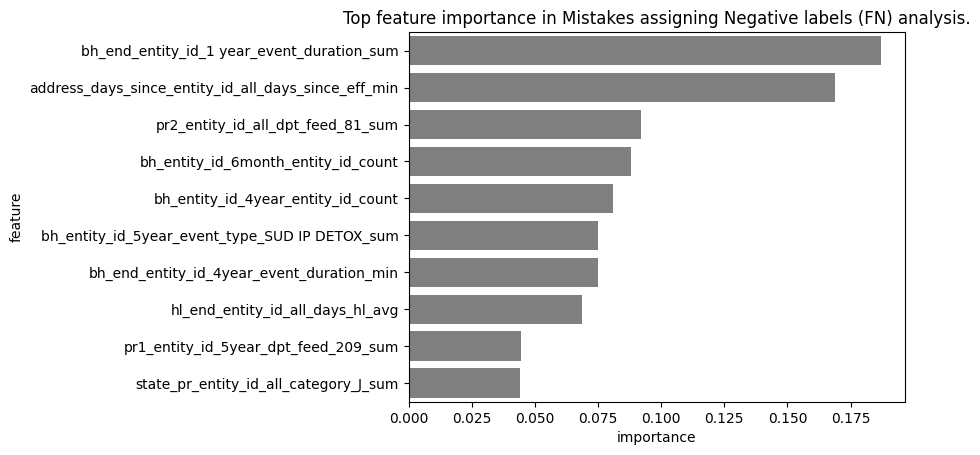


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


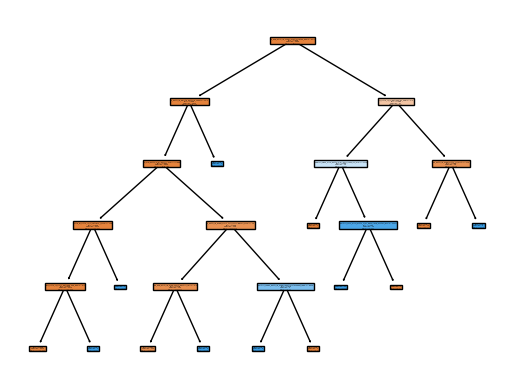

             ######            

        
    Model id: 1326
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


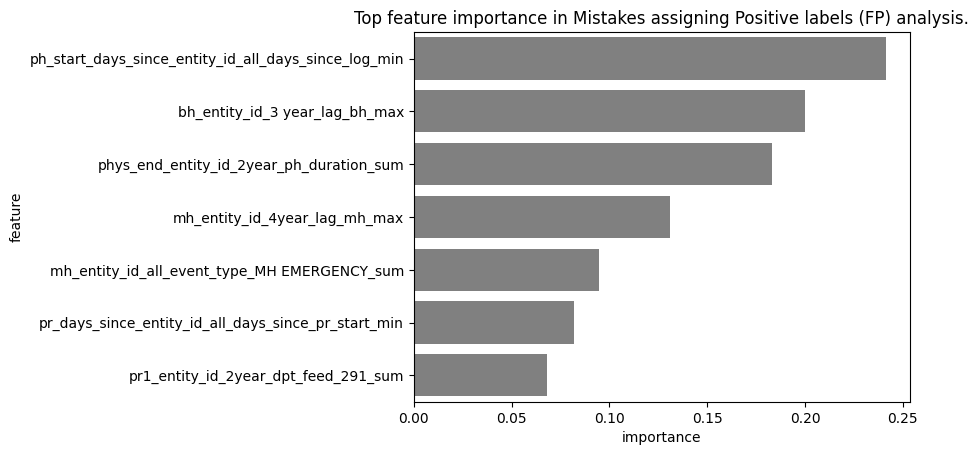


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


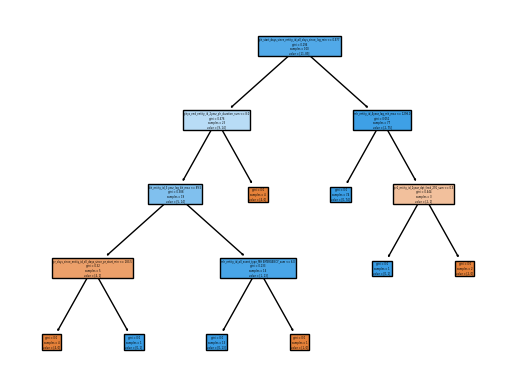

             ######            

        
    Model id: 1326
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


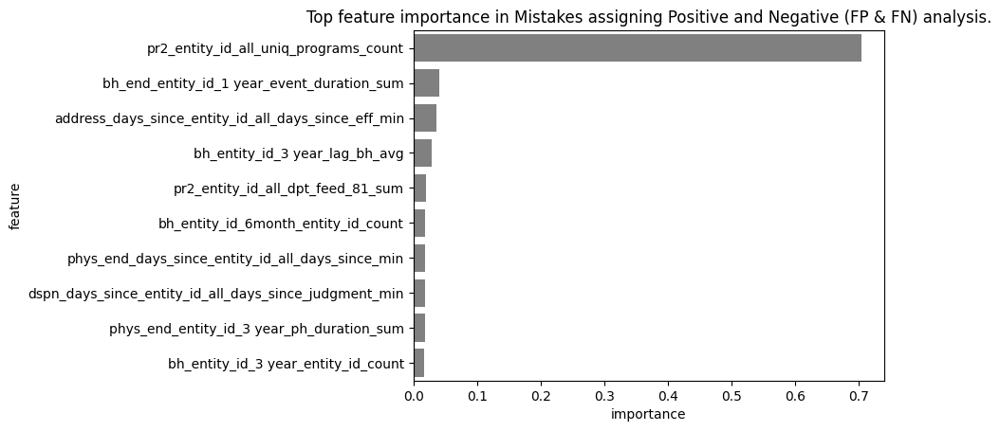


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


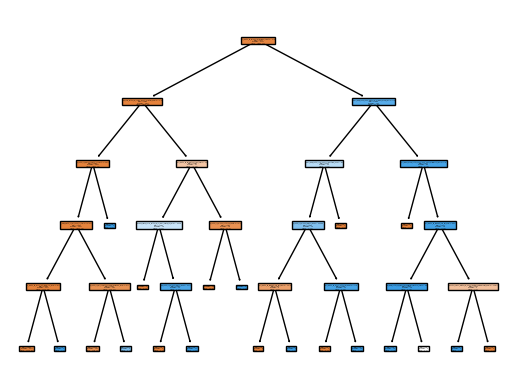

             ######            
*******************************************
2023-06-01 20:28:44 -    INFO generating error analysis for model id 1338
2023-06-01 20:28:44 -    INFO extracting predictions from model id: 1338
Error Analysis
--------------

        
    Model id: 1338
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


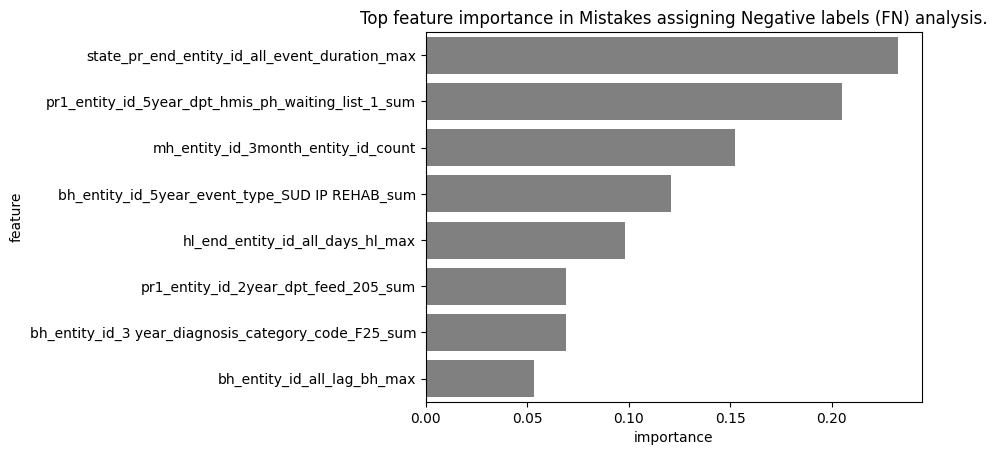


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


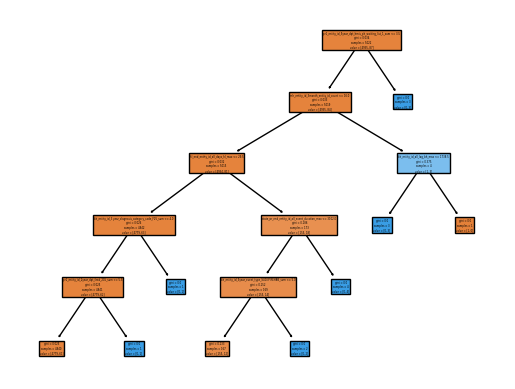

             ######            

        
    Model id: 1338
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


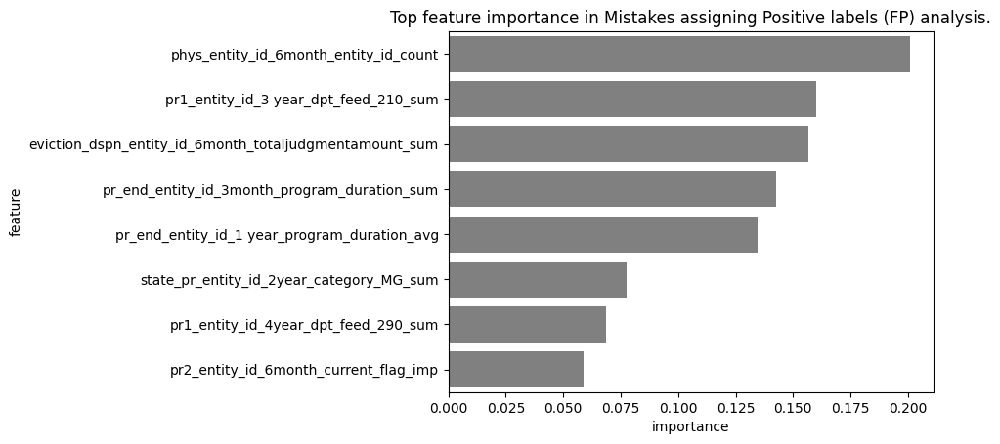


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


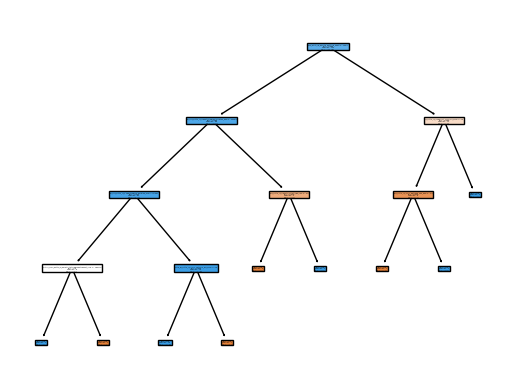

             ######            

        
    Model id: 1338
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


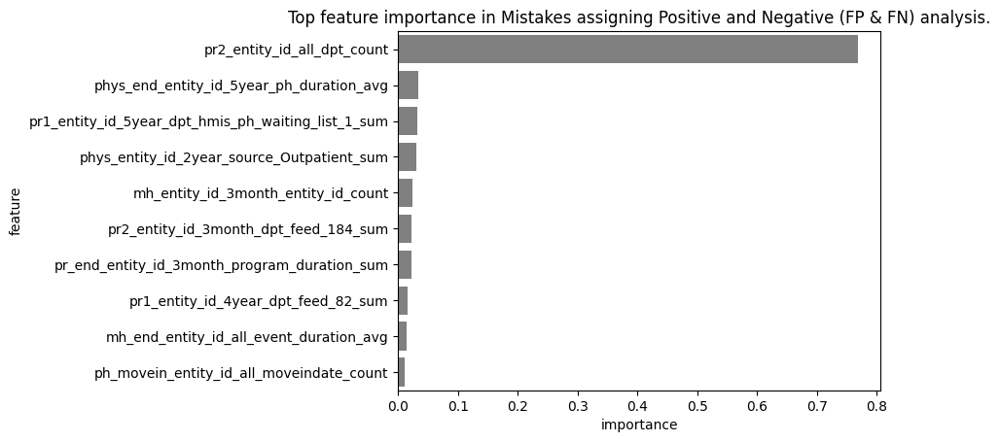


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


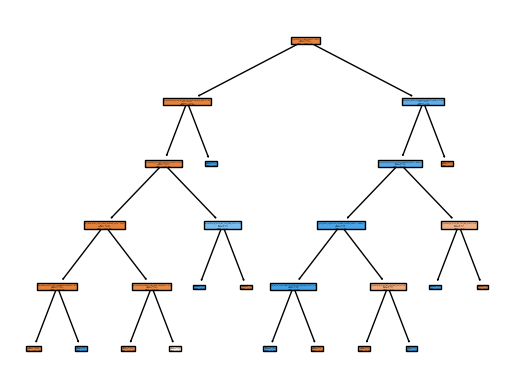

             ######            
*******************************************
2023-06-01 20:28:55 -    INFO generating error analysis for model id 1339
2023-06-01 20:28:55 -    INFO extracting predictions from model id: 1339
Error Analysis
--------------

        
    Model id: 1339
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


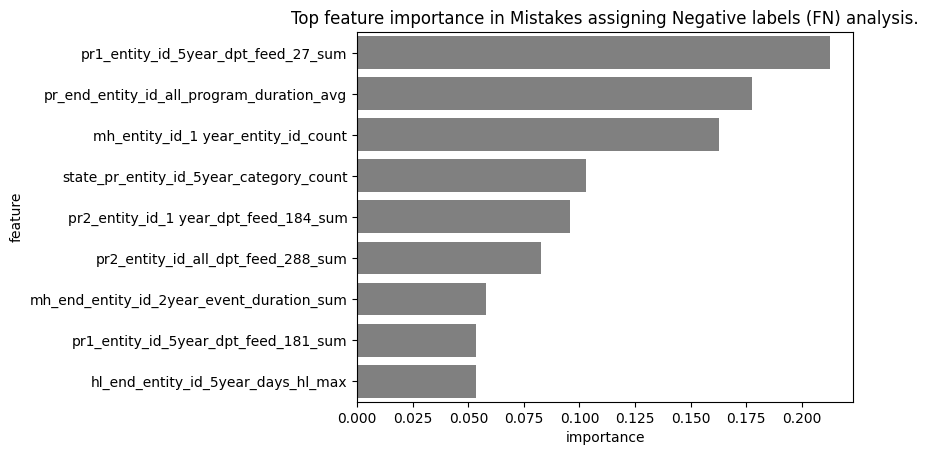


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


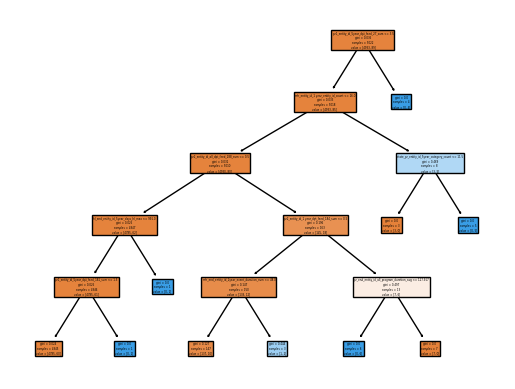

             ######            

        
    Model id: 1339
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


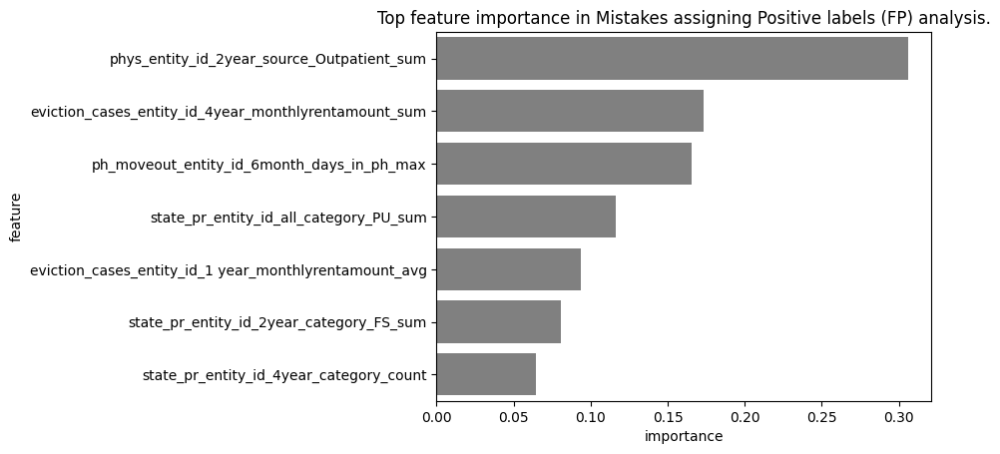


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


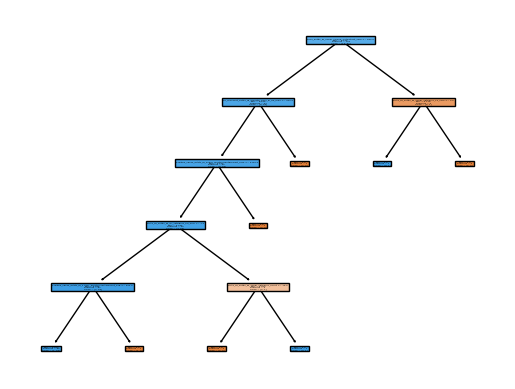

             ######            

        
    Model id: 1339
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


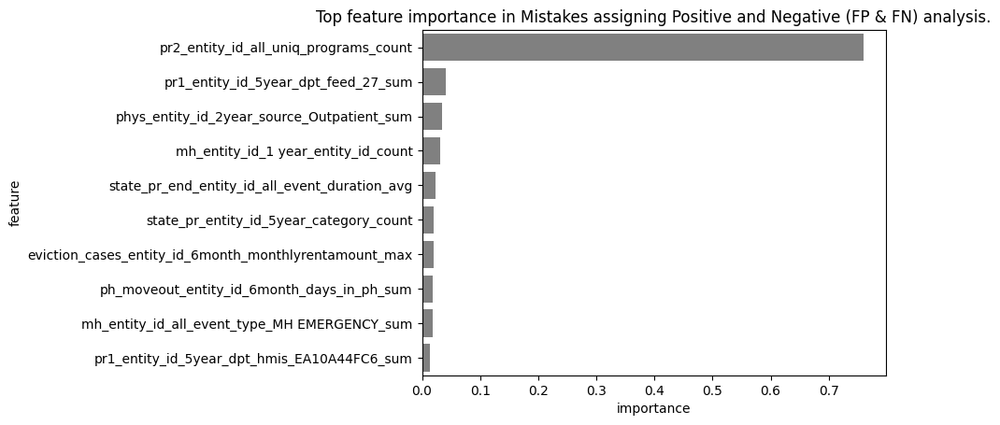


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


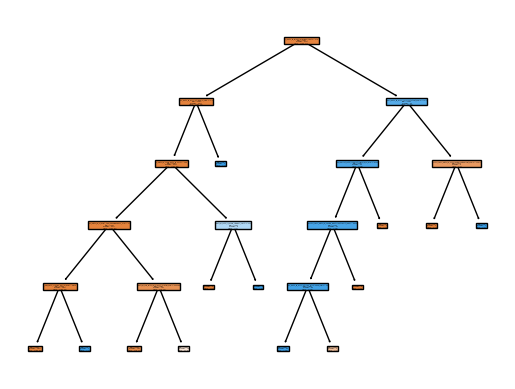

             ######            
*******************************************
2023-06-01 20:29:07 -    INFO generating error analysis for model id 1351
2023-06-01 20:29:07 -    INFO extracting predictions from model id: 1351
Error Analysis
--------------

        
    Model id: 1351
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


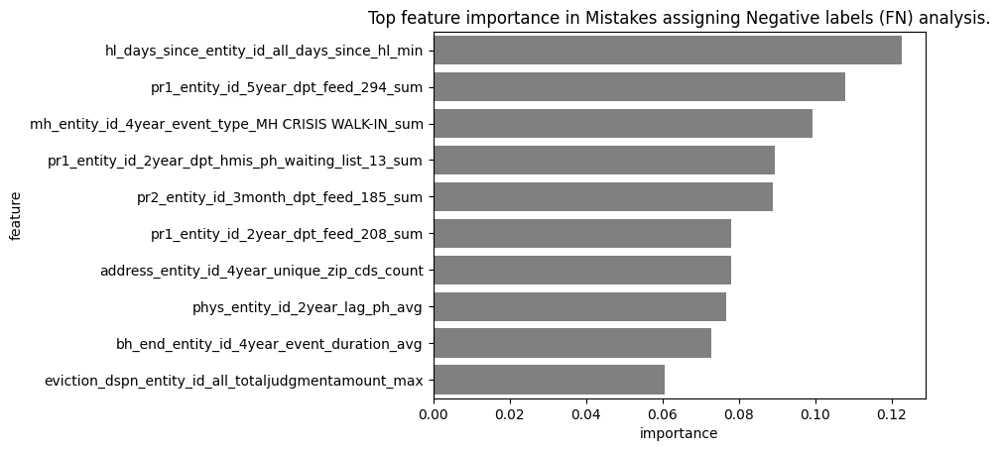


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


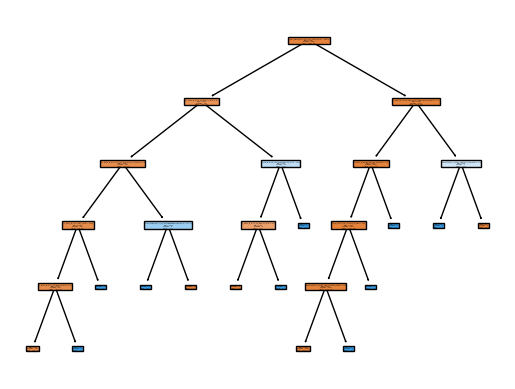

             ######            

        
    Model id: 1351
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


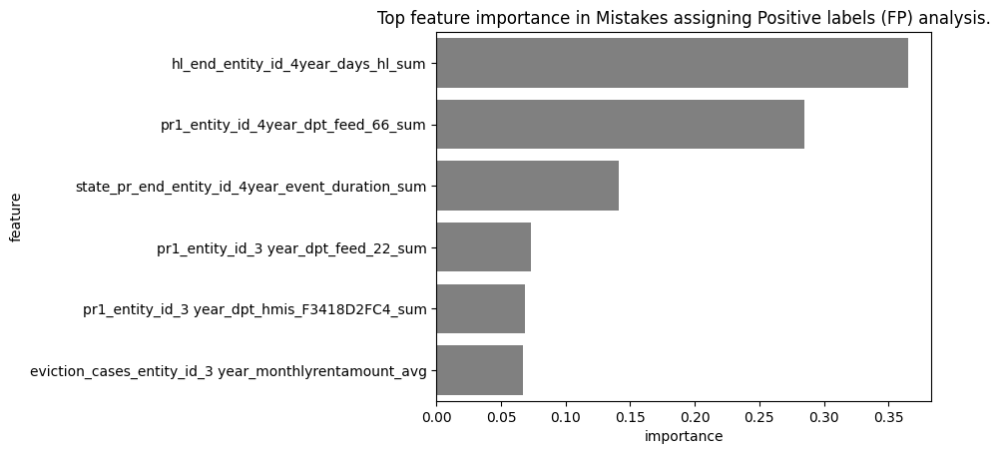


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


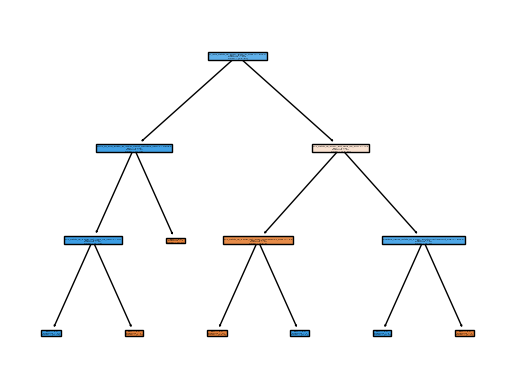

             ######            

        
    Model id: 1351
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


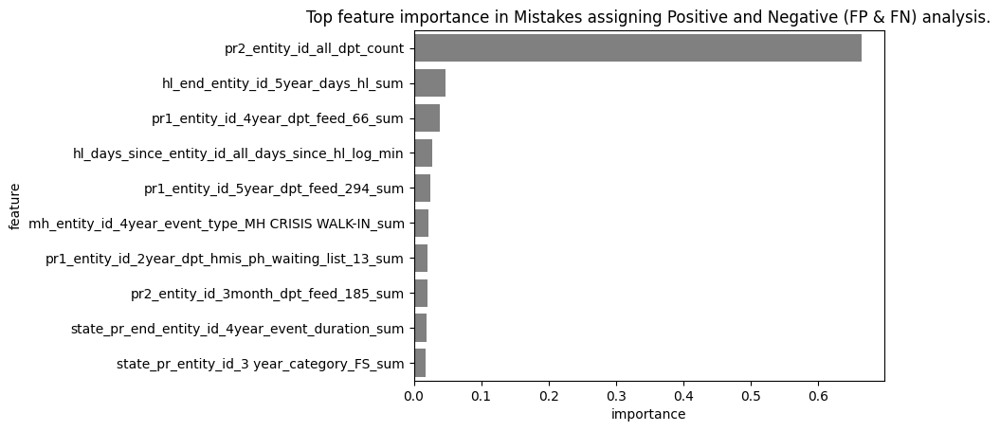


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


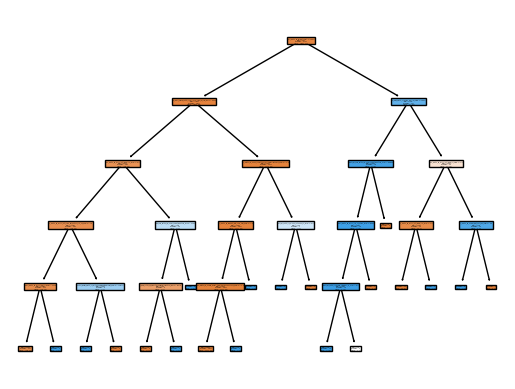

             ######            
*******************************************
2023-06-01 20:29:19 -    INFO generating error analysis for model id 1352
2023-06-01 20:29:19 -    INFO extracting predictions from model id: 1352
Error Analysis
--------------

        
    Model id: 1352
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


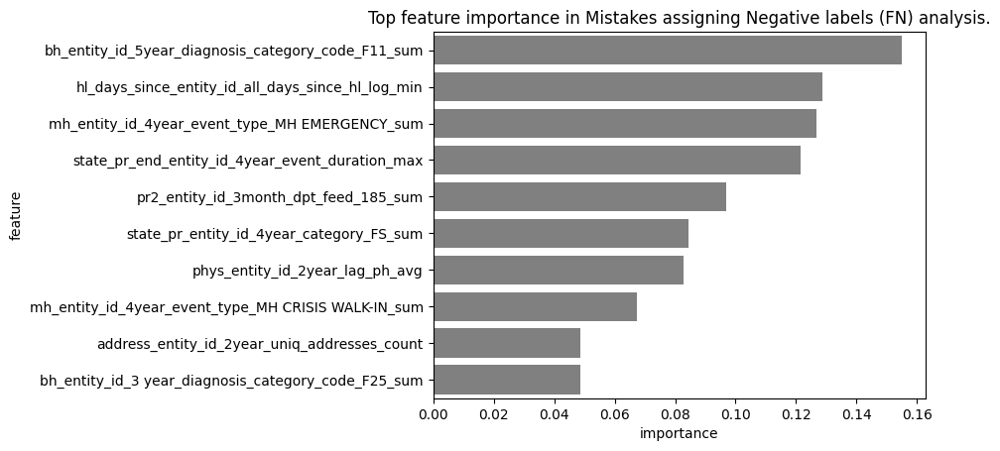


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


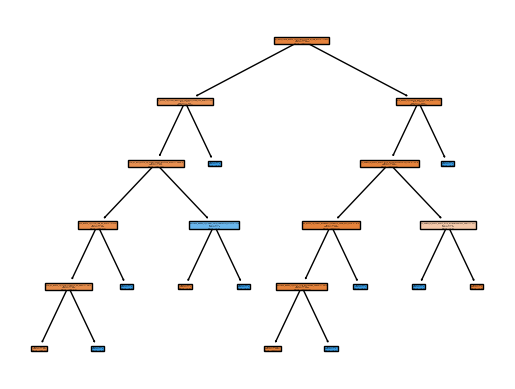

             ######            

        
    Model id: 1352
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


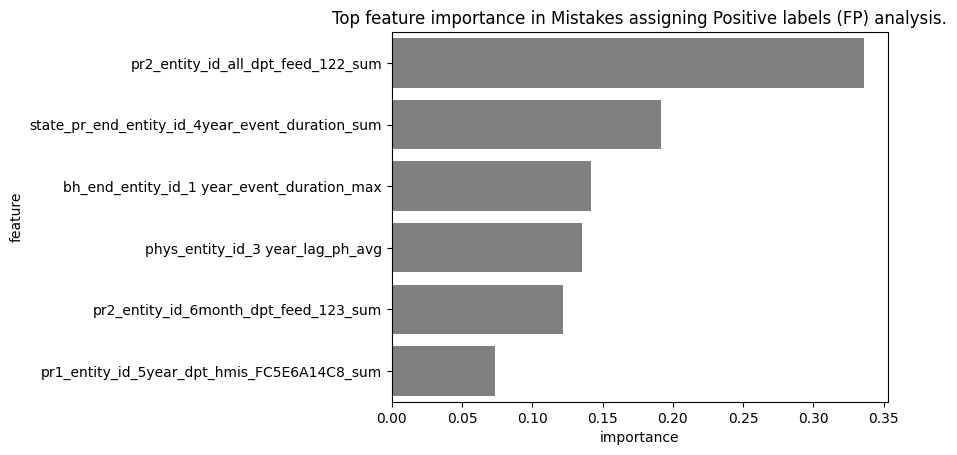


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


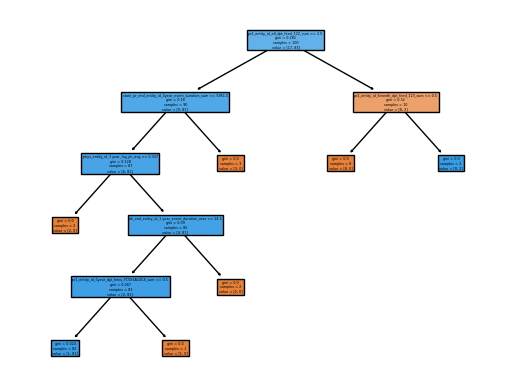

             ######            

        
    Model id: 1352
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


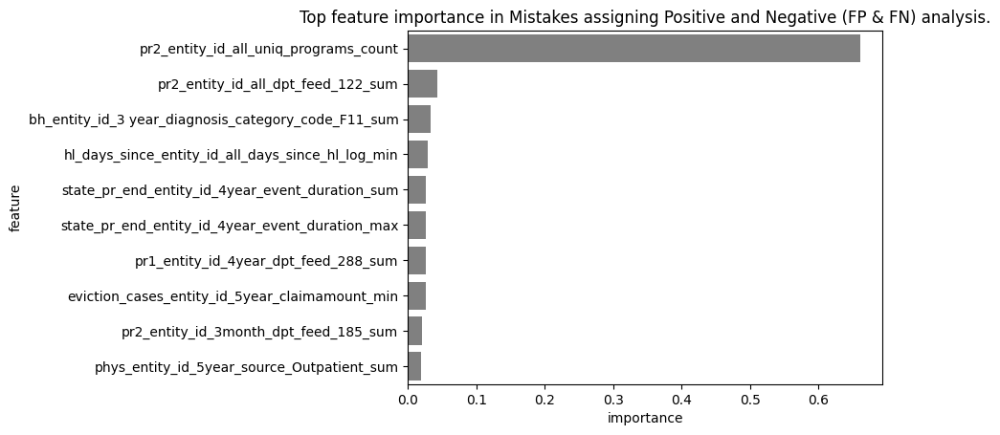


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


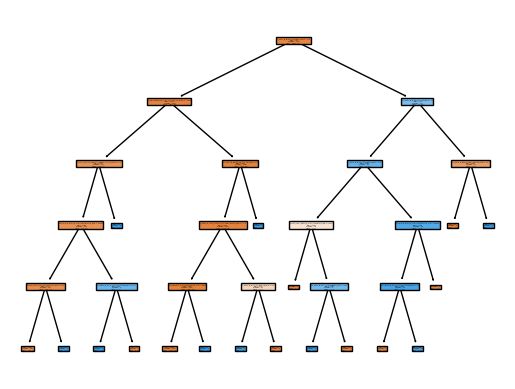

             ######            
*******************************************
2023-06-01 20:29:30 -    INFO generating error analysis for model id 1364
2023-06-01 20:29:30 -    INFO extracting predictions from model id: 1364
Error Analysis
--------------

        
    Model id: 1364
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


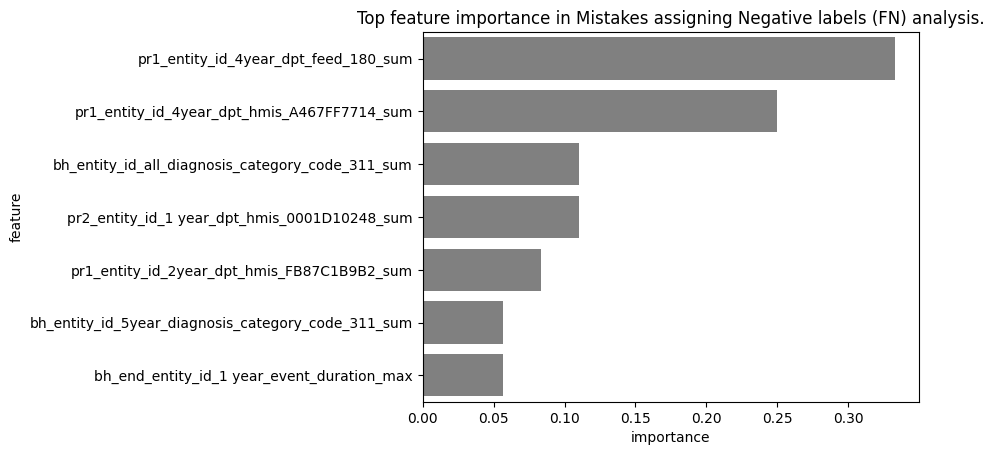


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


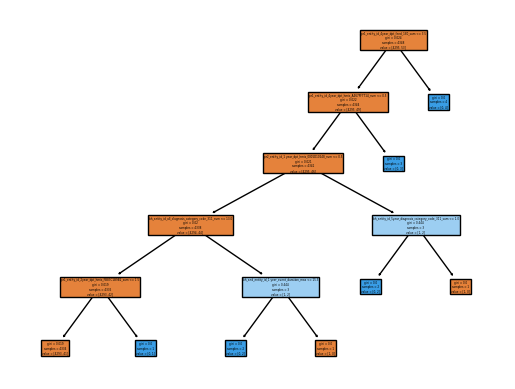

             ######            

        
    Model id: 1364
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


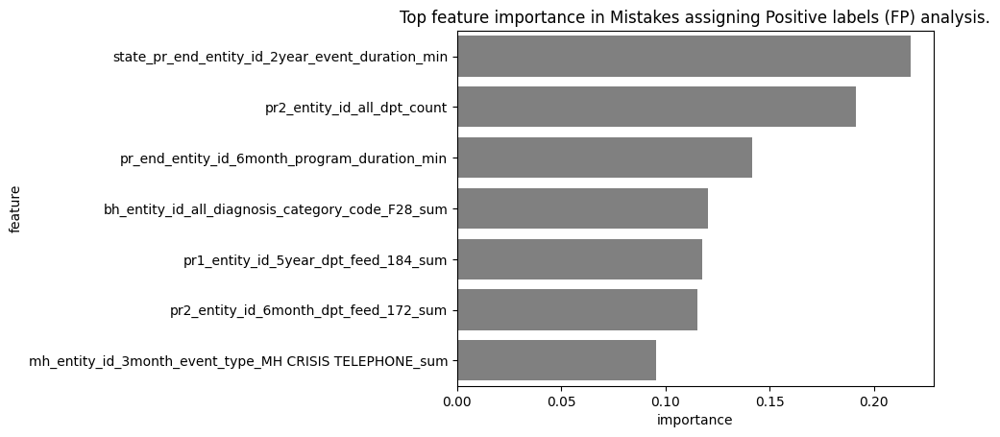


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


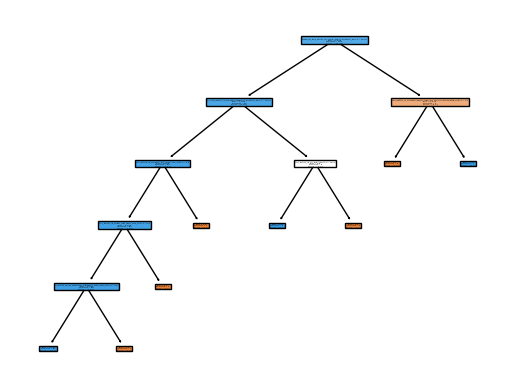

             ######            

        
    Model id: 1364
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


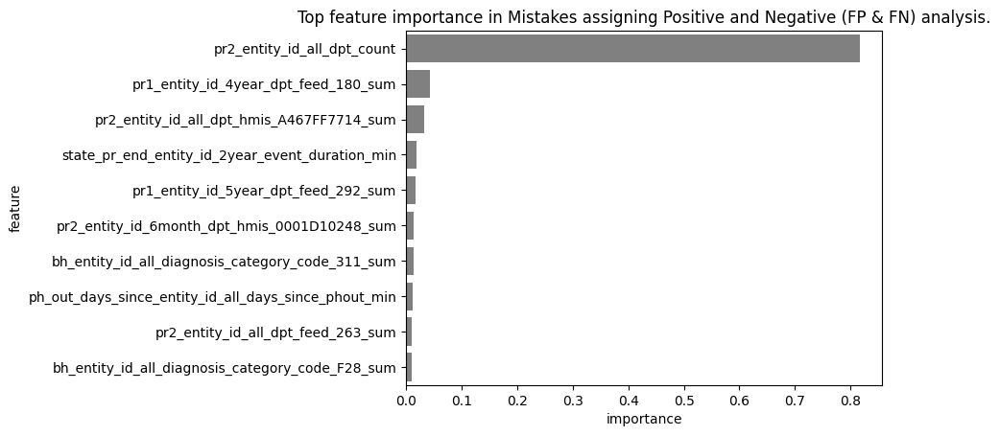


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


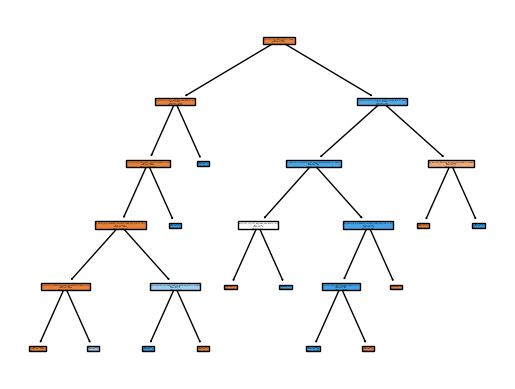

             ######            
*******************************************
2023-06-01 20:29:41 -    INFO generating error analysis for model id 1365
2023-06-01 20:29:41 -    INFO extracting predictions from model id: 1365
Error Analysis
--------------

        
    Model id: 1365
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


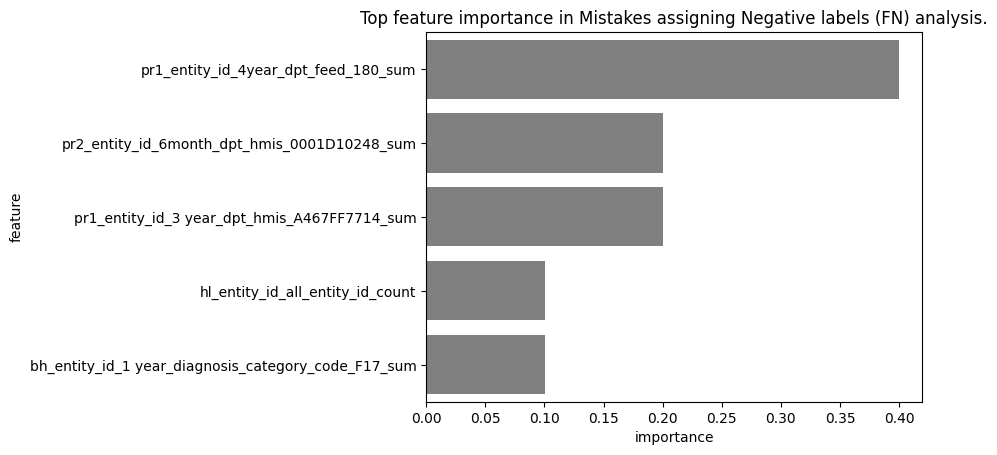


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


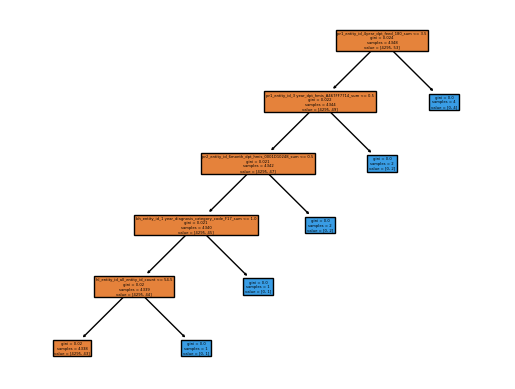

             ######            

        
    Model id: 1365
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


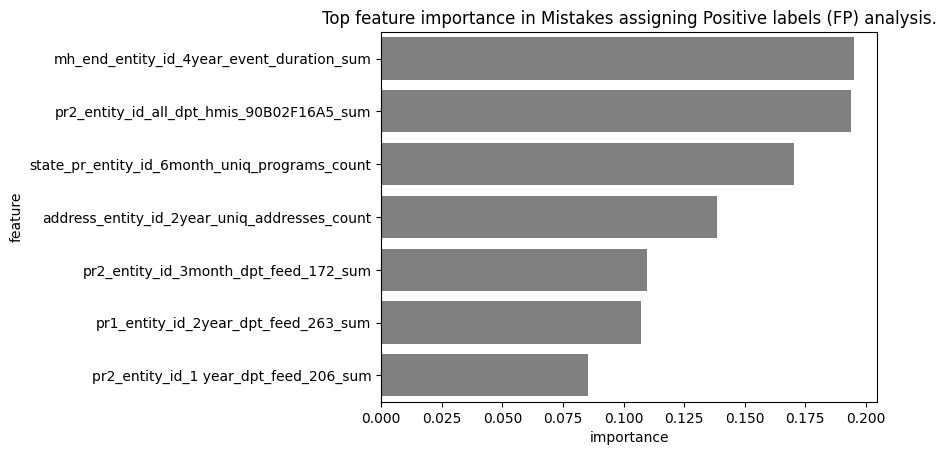


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


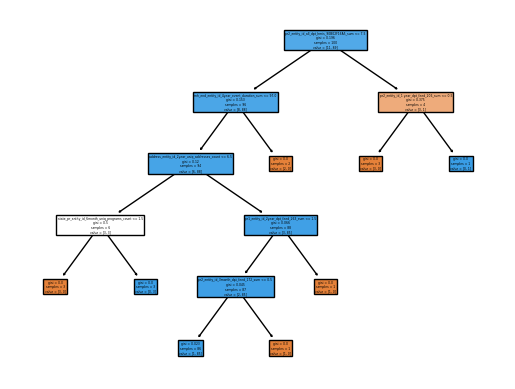

             ######            

        
    Model id: 1365
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


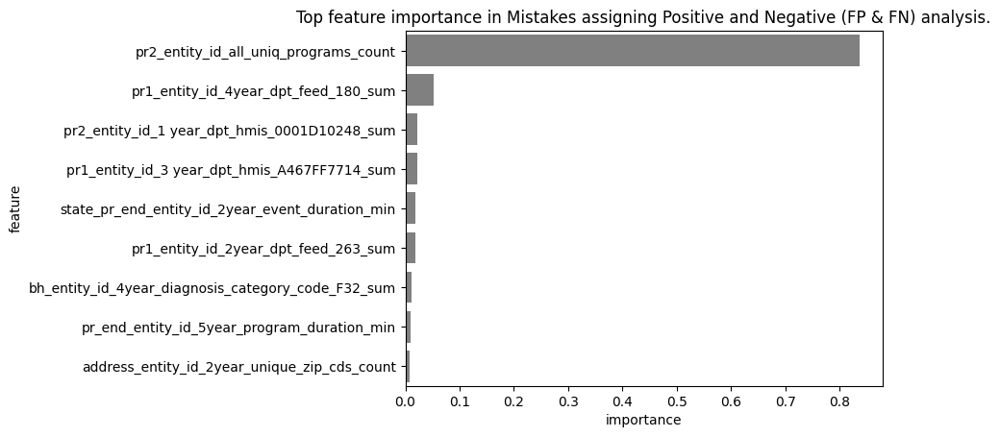


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


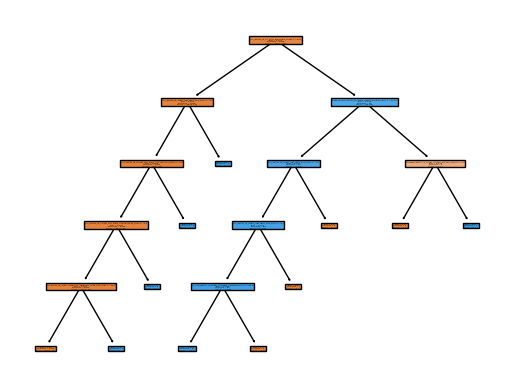

             ######            
*******************************************
2023-06-01 20:29:51 -    INFO generating error analysis for model id 1377
2023-06-01 20:29:51 -    INFO extracting predictions from model id: 1377
Error Analysis
--------------

        
    Model id: 1377
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


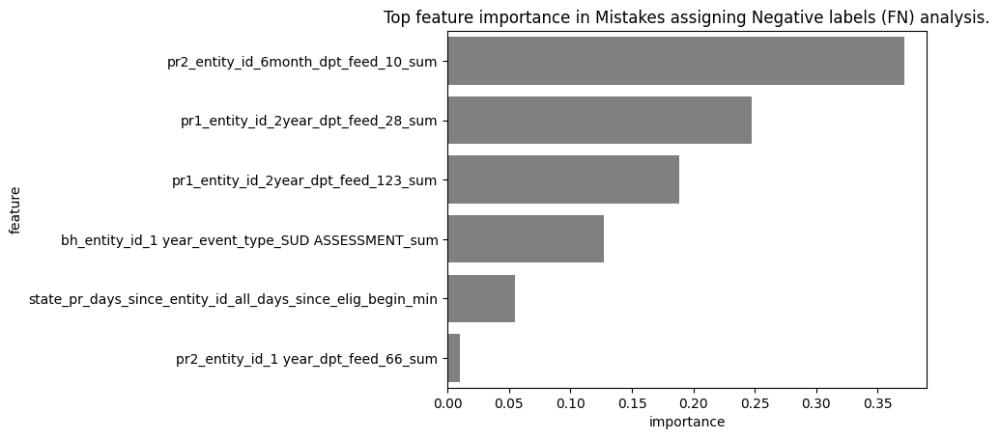


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


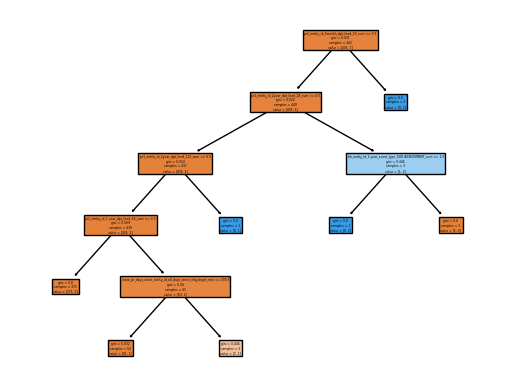

             ######            

        
    Model id: 1377
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


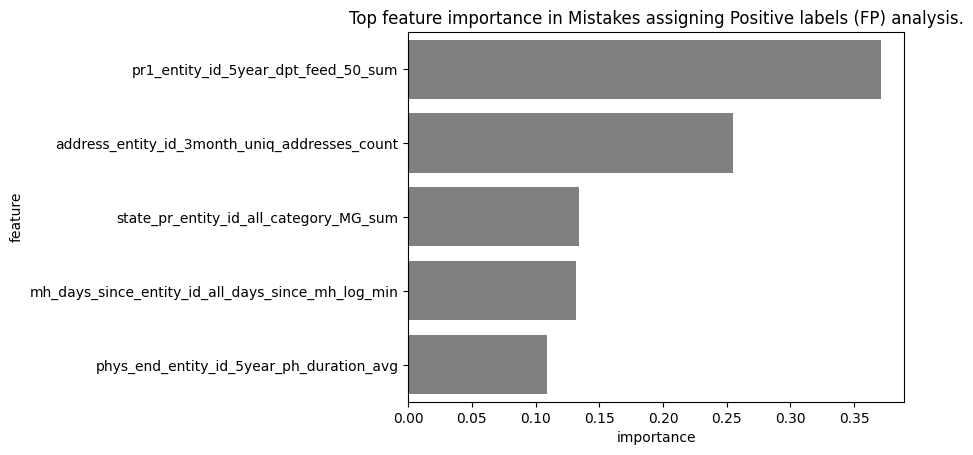


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


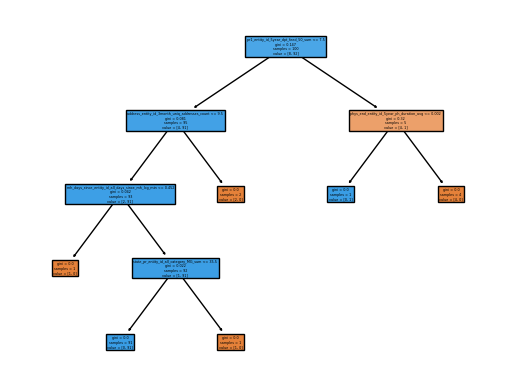

             ######            

        
    Model id: 1377
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


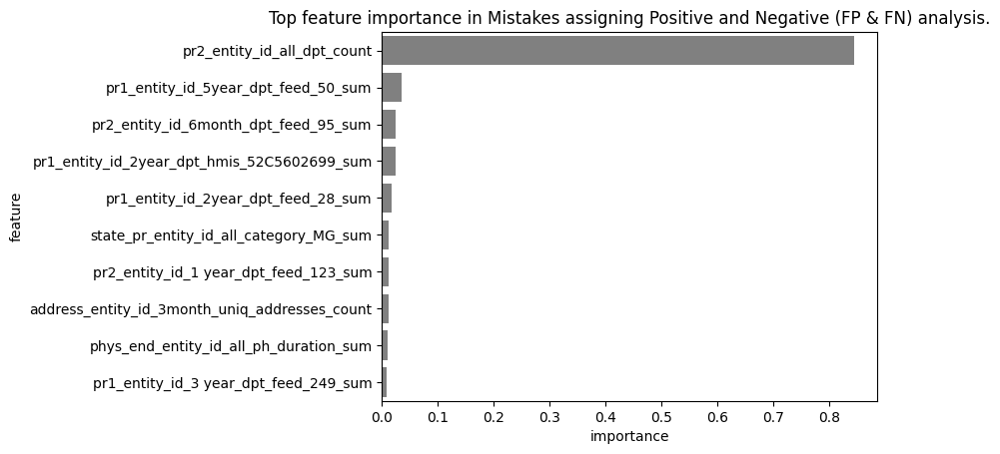


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


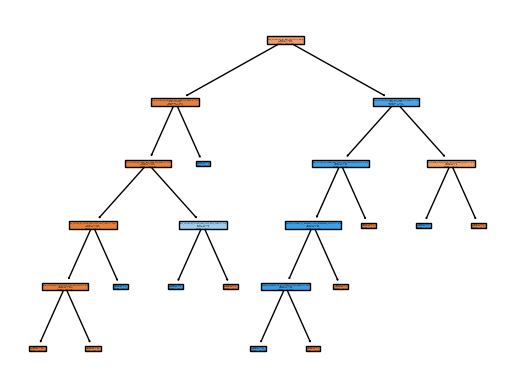

             ######            
*******************************************
2023-06-01 20:29:58 -    INFO generating error analysis for model id 1378
2023-06-01 20:29:58 -    INFO extracting predictions from model id: 1378
Error Analysis
--------------

        
    Model id: 1378
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


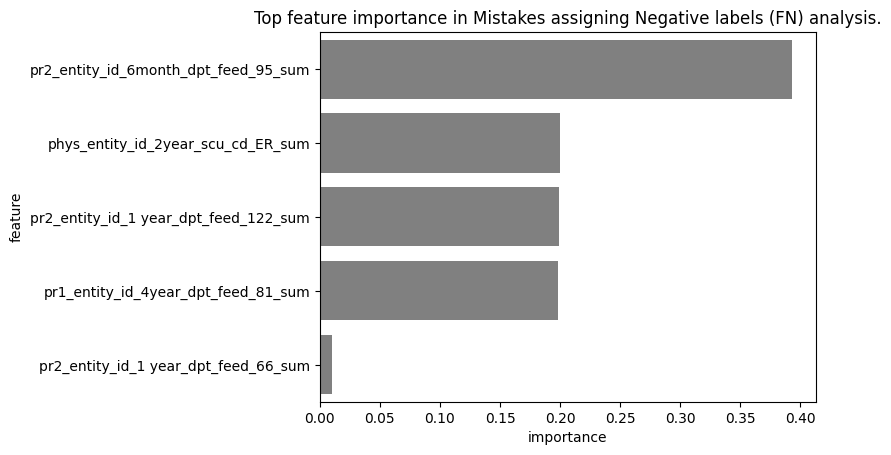


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


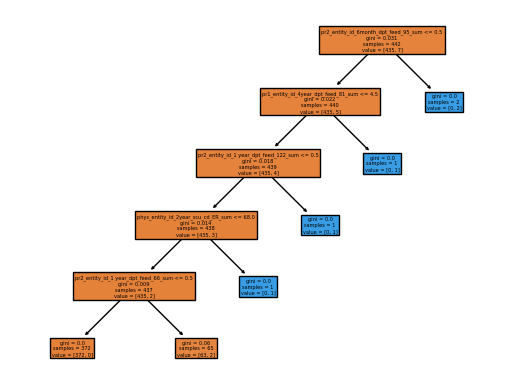

             ######            

        
    Model id: 1378
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


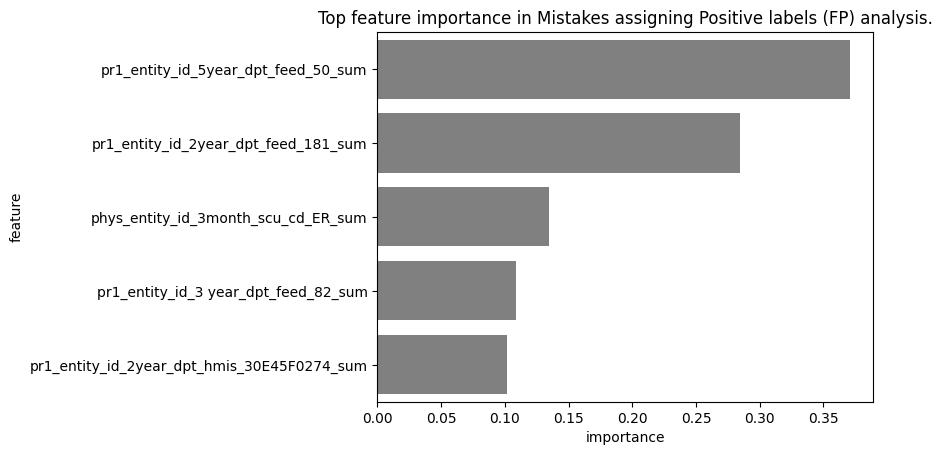


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


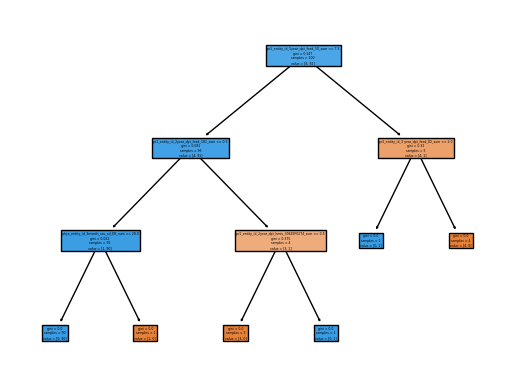

             ######            

        
    Model id: 1378
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


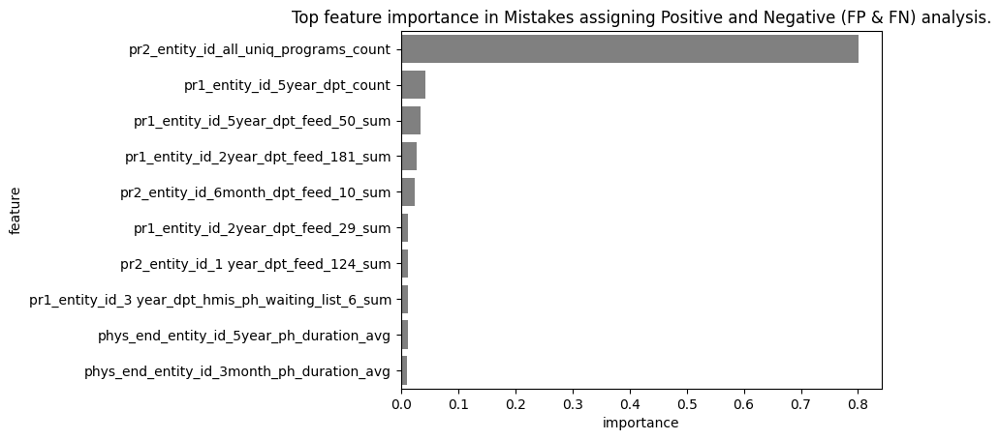


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


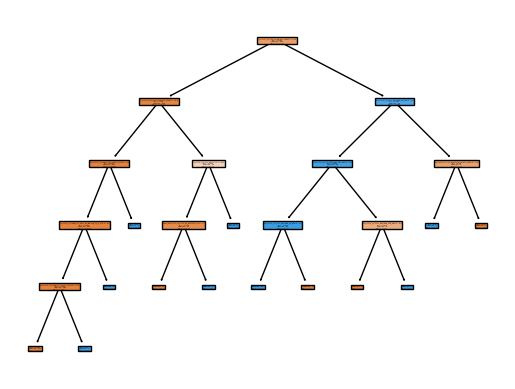

             ######            
*******************************************
2023-06-01 20:30:05 -    INFO generating error analysis for model id 1390
2023-06-01 20:30:05 -    INFO extracting predictions from model id: 1390
Error Analysis
--------------

        
    Model id: 1390
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


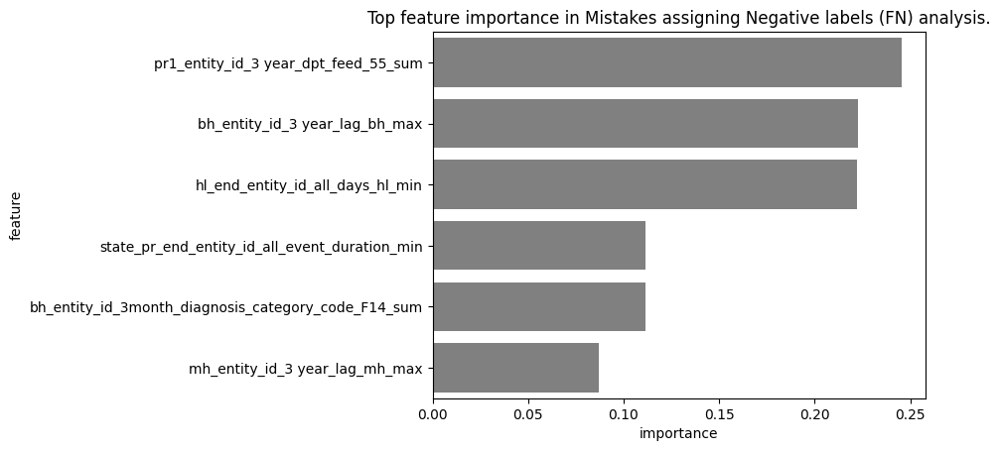


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


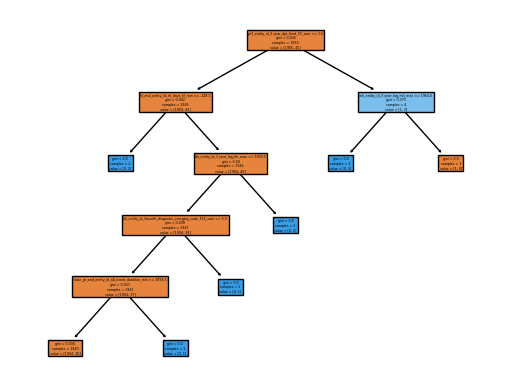

             ######            

        
    Model id: 1390
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


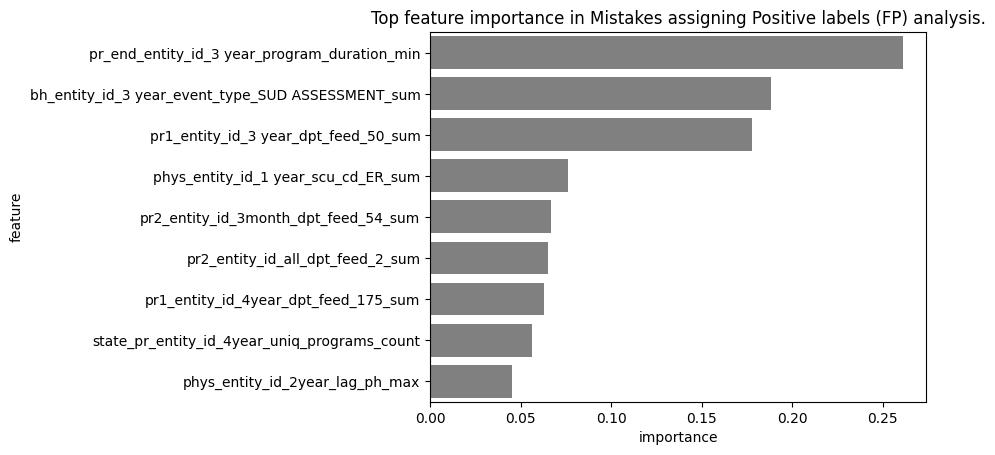


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


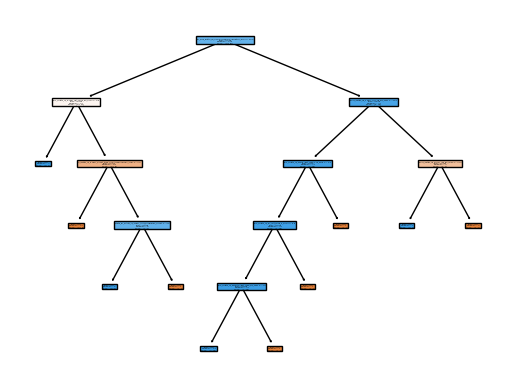

             ######            

        
    Model id: 1390
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


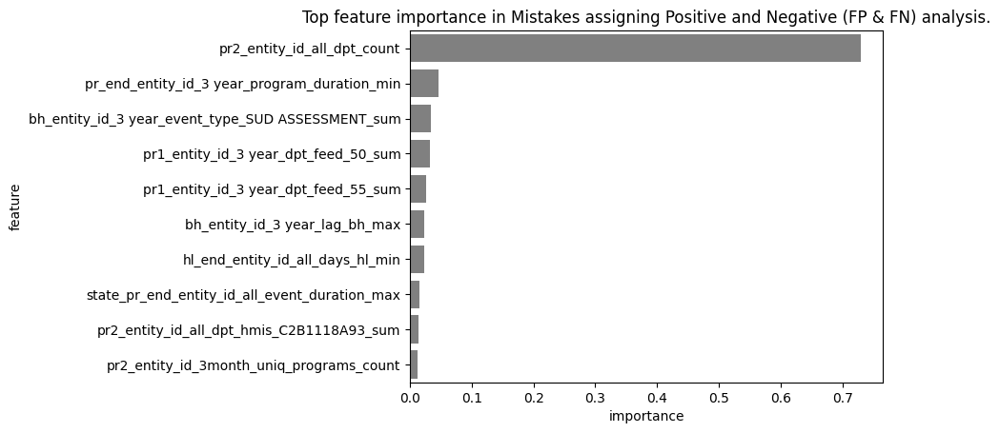


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


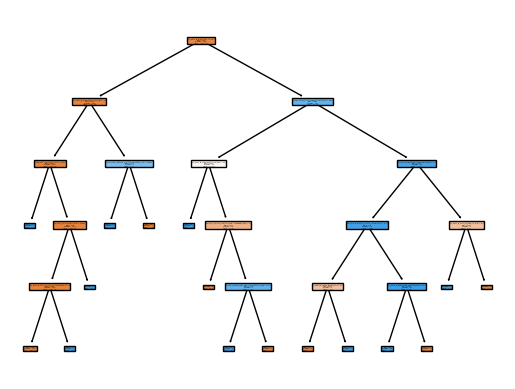

             ######            
*******************************************
2023-06-01 20:30:14 -    INFO generating error analysis for model id 1391
2023-06-01 20:30:14 -    INFO extracting predictions from model id: 1391
Error Analysis
--------------

        
    Model id: 1391
    Error analysis type: Mistakes assigning Negative labels (FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Negative labels (FN)
    


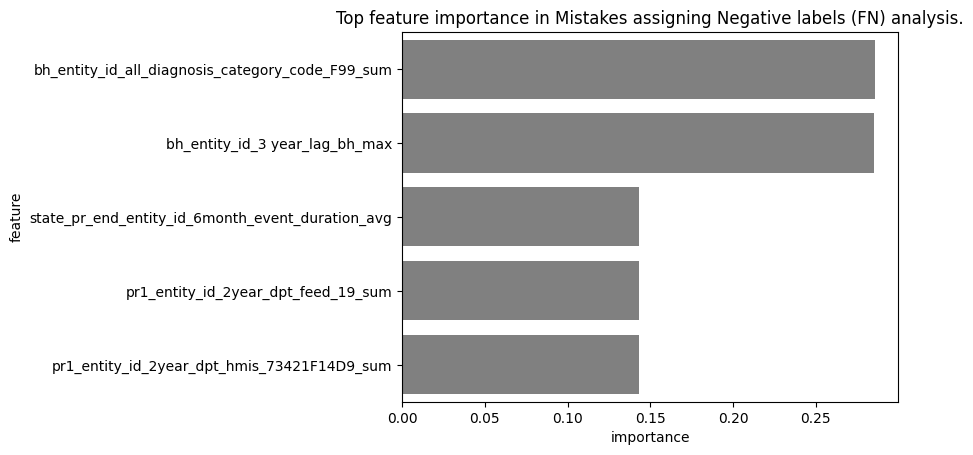


    Rules made with the top features associated with Mistakes assigning Negative labels (FN)
    


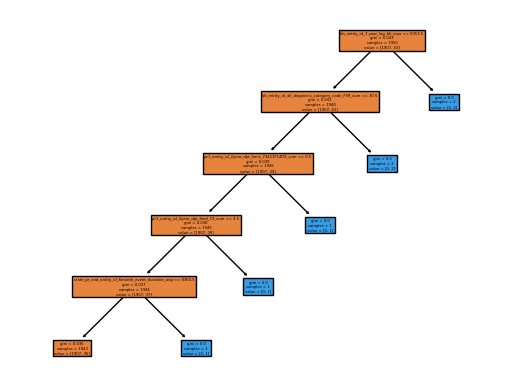

             ######            

        
    Model id: 1391
    Error analysis type: Mistakes assigning Positive labels (FP)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive labels (FP)
    


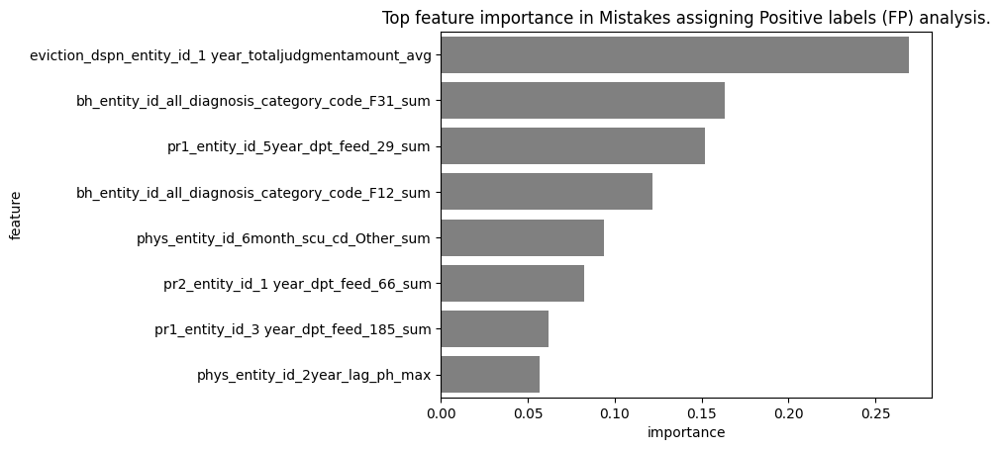


    Rules made with the top features associated with Mistakes assigning Positive labels (FP)
    


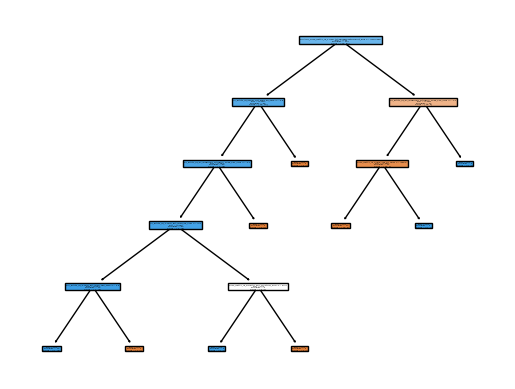

             ######            

        
    Model id: 1391
    Error analysis type: Mistakes assigning Positive and Negative (FP & FN)
    Size of the list: 100
    Decision Tree with max_depth of, 5

    Top feature importance associated with error in label type Mistakes assigning Positive and Negative (FP & FN)
    


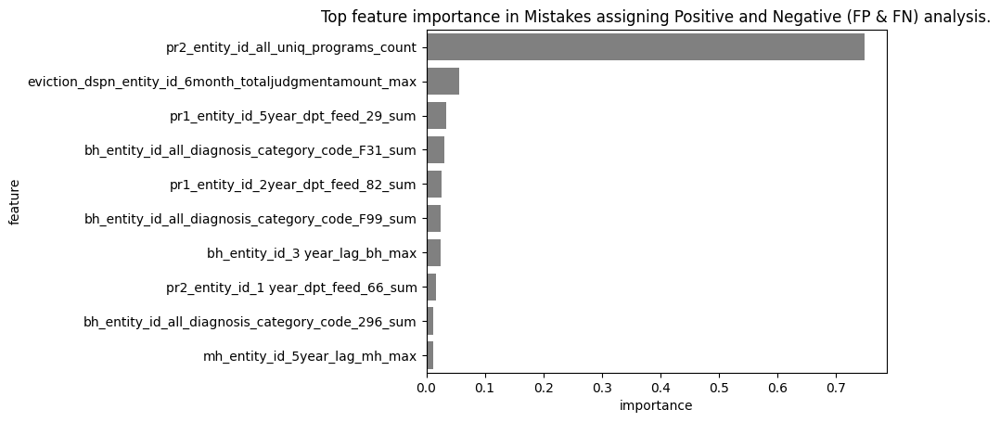


    Rules made with the top features associated with Mistakes assigning Positive and Negative (FP & FN)
    


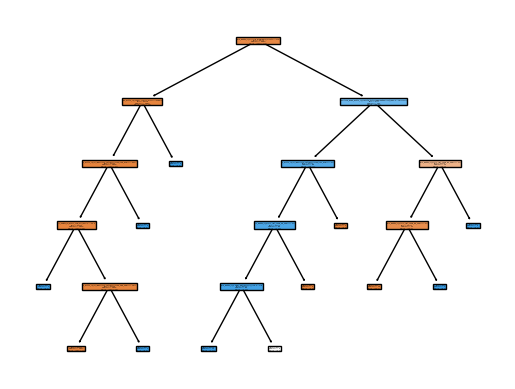

             ######            
*******************************************


In [7]:
rep.execute_error_analysis()

In [11]:
table_name = "kasun_crosstabs_test"

q = """
    select 
        model_id, feature, metric, value 
    from test_results.kasun_crosstab_test 
    where threshold_type = 'rank_abs_no_ties'
    and threshold = 100
    and 
    metric in (
        'mean_ratio_predicted_positive_to_predicted_negative',
        'support_predicted_positive',
        'support_predicted_negative'
    )
    and model_id = 1533
"""

ct = pd.read_sql(q, engine)

In [140]:
pivot_table = pd.pivot(ct, index='feature', columns='metric', values='value').sort_values('mean_ratio_predicted_positive_to_predicted_negative', ascending = False)

In [141]:
pivot_table.rename(columns={
    'mean_ratio_predicted_positive_to_predicted_negative': 'mean_ratio',
    'support_predicted_negative': 'support_neg',
    'support_predicted_positive': 'support_pos'
}, inplace=True
)
# pivot_table.reset_index(inplace=True)
# pivot_table.index.name=''
pivot_table.columns.name=''

In [142]:
msk = pivot_table['support_pos'] > 20

df = pivot_table[msk].head(10)

In [166]:
import matplotlib.pyplot as plt

import matplotlib.table as tab

import numpy as np

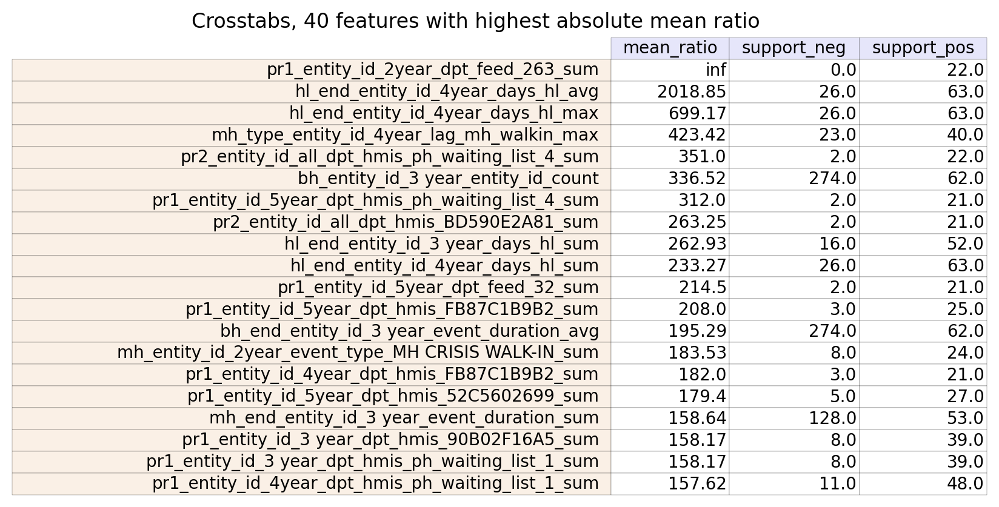

In [174]:
n = 20
df = pivot_table[msk].head(n)

fig, ax = plt.subplots(1, 1, dpi=200, figsize=(4, 1 + n / 5))

# hide axes
# fig.patch.set_visible(False)

# table = ax.table(
#     cellText=df.values.round(2), 
#     colLabels=df.columns, 
#     rowLabels=df.index, 
#     loc='center', 
#     bbox='tight')
# table.scale(1, 2)
# ax.axis('off')

# ax.set_title('Crosstabs, 40 features with highest absolte mean ratio')
# ax.layout('tight')
# plt.show()

rcolors = np.full(len(df.index), 'linen')
ccolors = np.full(len(df.columns), 'lavender')


t = tab.table(
    ax, 
    cellText=df.values.round(2), 
    colLabels=df.columns, 
    rowLoc='right',
    rowLabels=df.index, 
    colColours=ccolors,
    rowColours=rcolors,
    bbox=[0, 0, 1, 1]
)

ax.set_title('Crosstabs, 40 features with highest absolute mean ratio', x = -0.1)
ax.axis('off')
t.auto_set_column_width([0, 1, 2])
# t.auto_set_font_size(value=True)
for key, cell in t.get_celld().items():
    cell.set_linewidth(0.1)
    cell.PAD = 0.02
#     cell.set_fontsize(11)

In [67]:
!pip show matplotlib

Name: matplotlib
Version: 3.5.1
Summary: Python plotting package
Home-page: https://matplotlib.org
Author: John D. Hunter, Michael Droettboom
Author-email: matplotlib-users@python.org
License: PSF
Location: /home/kasun/.pyenv/versions/3.8.2/envs/triage-3.8.2/lib/python3.8/site-packages
Requires: cycler, fonttools, kiwisolver, numpy, packaging, pillow, pyparsing, python-dateutil
Required-by: adjustText, aequitas, seaborn, triage
